# GMTSAR Python: Radar to Geographic Coordinates Transformation

In [1]:
import sys
import os

In [2]:
import xarray as xr
import numpy as np
# supress numpy warnings
import warnings
warnings.filterwarnings('ignore')
import glob

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
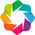

In [3]:
# plotting modules
import hvplot.xarray  # noqa
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

## Custom modules

In [4]:
!ls {os.path.join(os.environ['GMTSAR'],'bin','*.py')}

/usr/local/GMTSAR/bin/fetchOrbit.py
/usr/local/GMTSAR/bin/fit_planar_trend.py
/usr/local/GMTSAR/bin/intf_ra2ll.py
/usr/local/GMTSAR/bin/nearest_grid.py
/usr/local/GMTSAR/bin/trans_ra2ll.py


In [5]:
print(os.path.join(os.environ['GMTSAR'],'bin','*.py'))

/usr/local/GMTSAR/bin/*.py


In [6]:
sys.path.append(os.path.join(os.environ['GMTSAR'],'bin'))
from intf_ra2ll import intf_ra2ll_matrix, intf_ra2ll
from trans_ra2ll import trans_ra2ll_matrix

## Helper functions

In [7]:
gstiles = hv.Tiles('https://mt1.google.com/vt/lyrs=s&x={X}&y={Y}&z={Z}', name='Google Satellite')
ottiles = hv.Tiles('https://tile.opentopomap.org/{Z}/{X}/{Y}.png', name='Open Topo')

In [8]:
# stack by directory name for xr.open_mfdataset
def preprocess_dirname(ds):
    stack = ds.encoding["source"].split('/')[-2]
    return ds.assign(stack=stack)

def open_grids_stack(filenames):
    return xr.open_mfdataset(filenames, concat_dim='stack',combine='nested',
                               parallel=True, preprocess=preprocess_dirname)['z']

## Define parameters

In [9]:
ORBIT            = "asc"
SUBSWATHS        = "F2"

## Read Interferograms

In [10]:
filenames = f'{ORBIT}/{SUBSWATHS[:2]}/intf_all/???????_???????/phasefilt.grd'
phasefilts = open_grids_stack(filenames)

In [11]:
intf_filename = glob.glob(filenames)[0]
!ls -lh {intf_filename}

-rw-r--r--  1 mbg  staff    25M Sep 11 02:24 asc/F2/intf_all/2021019_2021031/phasefilt.grd


## trans_ra2ll.py - Transform Matrix for trans.dat from Radar to Geographic Coordinates

In [12]:
!trans_ra2ll.py

Usage: /usr/local/GMTSAR/bin/trans_ra2ll.py trans.dat dem.grd trans_ra2ll.grd


In [13]:
!trans_ra2ll.py {ORBIT}/topo/trans.dat {ORBIT}/topo/dem.grd {ORBIT}/topo/trans_ra2ll.grd

## intf_ra2ll.py - Transform Matrix for Interferogram from Radar to Geographic Coordinates 

In [14]:
!intf_ra2ll.py

Usage: /usr/local/GMTSAR/bin/intf_ra2ll.py trans.dat trans_ra2ll.grd phasefilt.grd intf_ra2ll.grd


In [15]:
!intf_ra2ll.py {ORBIT}/topo/trans.dat {ORBIT}/topo/trans_ra2ll.grd {intf_filename} {ORBIT}/topo/intf_ra2ll.grd

In [16]:
!ls -lh {ORBIT}/topo/intf_ra2ll.grd

-rw-r--r--  1 mbg  staff   6.8M Sep 13 13:08 asc/topo/intf_ra2ll.grd


## Transform Interferogram from Radar to Geographic Coordinates 

In [17]:
%%time
intf_ra2ll_matrix = xr.open_dataarray(f'{ORBIT}/topo/intf_ra2ll.grd', chunks={'y':1e6,'x':1e6}).persist()
intf_ra2ll_matrix

CPU times: user 535 ms, sys: 169 ms, total: 704 ms
Wall time: 755 ms


<xarray.DataArray 'intf_ra2ll' (lat: 3320, lon: 5745)>
dask.array<open_dataset-db349f052033aabc4ea7d1b62d934d40intf_ra2ll, shape=(3320, 5745), dtype=int64, chunksize=(3320, 5745), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 37.8 37.8 37.8 37.8 37.8 ... 38.46 38.46 38.47 38.47
  * lon      (lon) float64 47.73 47.73 47.73 47.73 ... 48.88 48.88 48.88 48.88
Attributes:
    long_name:     GDAL Band Number 1
    grid_mapping:  crs
    node_offset:   1

In [18]:
phasefilts

<xarray.DataArray 'z' (stack: 9, y: 2068, x: 3208)>
dask.array<concatenate, shape=(9, 2068, 3208), dtype=float32, chunksize=(1, 2068, 3208), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 4.0 12.0 20.0 28.0 ... 2.564e+04 2.565e+04 2.566e+04
  * y        (y) float64 1.0 3.0 5.0 7.0 ... 4.131e+03 4.133e+03 4.135e+03
  * stack    (stack) <U15 '2021007_2021019' ... '2021043_2021055'
Attributes:
    long_name:     z
    actual_range:  [-3.14159226  3.14159226]

In [19]:
%%time
intf_ll = intf_ra2ll(phasefilts, intf_ra2ll_matrix)
intf_ll

CPU times: user 10.9 ms, sys: 13.1 ms, total: 24 ms
Wall time: 24.2 ms


<xarray.DataArray (stack: 9, lat: 3320, lon: 5745)>
dask.array<transpose, shape=(9, 3320, 5745), dtype=float32, chunksize=(1, 3320, 5745), chunktype=numpy.ndarray>
Coordinates:
  * stack    (stack) <U15 '2021007_2021019' ... '2021043_2021055'
  * lat      (lat) float64 37.8 37.8 37.8 37.8 37.8 ... 38.46 38.46 38.47 38.47
  * lon      (lon) float64 47.73 47.73 47.73 47.73 ... 48.88 48.88 48.88 48.88

In [20]:
%%time
intf_ll[0].values.shape

CPU times: user 236 ms, sys: 176 ms, total: 412 ms
Wall time: 468 ms


(3320, 5745)

In [21]:
%%time
da = intf_ll[0].coarsen({'lon':5,'lat':5},boundary='trim').median().load()

CPU times: user 1.36 s, sys: 230 ms, total: 1.58 s
Wall time: 1.59 s


In [22]:
%%time
opts = {'width':320, 'height':280, 'geo':True, 'cmap':'hsv_r', 'colorbar':False, 'use_dask':True}

da.hvplot(**(opts | {'tiles':gstiles, 'alpha':0.5, 'title':'Google Satellite'})) + \
da.hvplot(**(opts | {'tiles':ottiles, 'alpha':0.5, 'title':'OpenTopoMap'     })) + \
da.hvplot(**(opts | {'tiles':False,   'alpha':1.0, 'title':'Interferogram'   }))

CPU times: user 4.04 s, sys: 586 ms, total: 4.63 s
Wall time: 5.36 s


:Layout
   .Overlay.I  :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [lon,lat]   (value)
   .Overlay.II :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [lon,lat]   (value)
   .Image.I    :Image   [lon,lat]   (value)